# Final Project Presentation

## Part 1: Intro of Dataset

The name of the dataset is "oil-and-gas-refining_emissions_sources.csv". 

We obtained it from the Climate TRACE website (https://climatetrace.org/data) under "Fossil Fuel Operations". 

We located the license of the dataset in the about_the_data.pdf file within the ABOUT_THE_DATA folder. The document states that "all Climate TRACE data is freely available under the Creative Commons Attribution 4.0 International Public License". 

The file size is 12.5MB and there are 27360 items. 

## Part 2: Data Cleaning and Analysis

In [1]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# Pass in the dataset into df dataframe
df = pd.read_csv("https://raw.githubusercontent.com/adlthya/adlthya.github.io/main/_data/oil-and-gas-refining_emissions_sources.csv")
df.head()

,source_id,source_name,source_type,iso3_country,original_inventory_sector,start_time,end_time,lat,lon,geometry_ref,...,other7,other7_def,other8,other8_def,other9,other9_def,other10,other10_def,created_date,modified_date
0,3143714,Ghazanfar Oil Refinery,Hydroskimming,AFG,oil-and-gas-refining,2015-01-01 00:00:00,2015-12-31 00:00:00,37.208141,67.408271,trace_67.408271_37.208141,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2023-09-07 00:00:00,NaN
1,3143714,Ghazanfar Oil Refinery,Hydroskimming,AFG,oil-and-gas-refining,2015-01-01 00:00:00,2015-12-31 00:00:00,37.208141,67.408271,trace_67.408271_37.208141,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2023-09-07 00:00:00,NaN
2,3143714,Ghazanfar Oil Refinery,Hydroskimming,AFG,oil-and-gas-refining,2015-01-01 00:00:00,2015-12-31 00:00:00,37.208141,67.408271,trace_67.408271_37.208141,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2023-09-07 00:00:00,NaN
3,3143714,Ghazanfar Oil Refinery,Hydroskimming,AFG,oil-and-gas-refining,2015-01-01 00:00:00,2015-12-31 00:00:00,37.208141,67.408271,trace_67.408271_37.208141,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2023-09-07 00:00:00,NaN
4,3143714,Ghazanfar Oil Refinery,Hydroskimming,AFG,oil-and-gas-refining,2015-01-01 00:00:00,2015-12-31 00:00:00,37.208141,67.408271,trace_67.408271_37.208141,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2023-09-07 00:00:00,NaN


In [3]:
# Show all of the column names
df.columns

Index(['source_id', 'source_name', 'source_type', 'iso3_country',
       'original_inventory_sector', 'start_time', 'end_time', 'lat', 'lon',
       'geometry_ref', 'gas', 'emissions_quantity', 'temporal_granularity',
       'emissions_factor', 'emissions_factor_units', 'capacity_factor',
       'other1', 'other1_def', 'other2', 'other2_def', 'other3', 'other3_def',
       'other4', 'other4_def', 'other5', 'other5_def', 'other6', 'other6_def',
       'other7', 'other7_def', 'other8', 'other8_def', 'other9', 'other9_def',
       'other10', 'other10_def', 'created_date', 'modified_date'],
      dtype='object')

In [4]:
# Delete unrelated columns
df.drop(columns=['other1', 'other1_def', 'other2', 'other2_def', 'other3', 'other3_def',
       'other4', 'other4_def', 'other5', 'other5_def', 'other6', 'other6_def',
       'other7', 'other7_def', 'other8', 'other8_def', 'other9', 'other9_def',
       'other10', 'other10_def', 'created_date', 'modified_date'], axis=0, inplace=True)
df.head()

,source_id,source_name,source_type,iso3_country,original_inventory_sector,start_time,end_time,lat,lon,geometry_ref,gas,emissions_quantity,temporal_granularity,emissions_factor,emissions_factor_units,capacity_factor
0,3143714,Ghazanfar Oil Refinery,Hydroskimming,AFG,oil-and-gas-refining,2015-01-01 00:00:00,2015-12-31 00:00:00,37.208141,67.408271,trace_67.408271_37.208141,ch4,5.471610,annual,0.002829,T of CH4 per barrel refined,0.441624
1,3143714,Ghazanfar Oil Refinery,Hydroskimming,AFG,oil-and-gas-refining,2015-01-01 00:00:00,2015-12-31 00:00:00,37.208141,67.408271,trace_67.408271_37.208141,co2,36425.237420,annual,18.831081,T of CO2 per barrel refined,0.441624
2,3143714,Ghazanfar Oil Refinery,Hydroskimming,AFG,oil-and-gas-refining,2015-01-01 00:00:00,2015-12-31 00:00:00,37.208141,67.408271,trace_67.408271_37.208141,co2e_100yr,37464.235740,annual,0.000281,NaN,0.441624
3,3143714,Ghazanfar Oil Refinery,Hydroskimming,AFG,oil-and-gas-refining,2015-01-01 00:00:00,2015-12-31 00:00:00,37.208141,67.408271,trace_67.408271_37.208141,co2e_20yr,37464.399500,annual,0.000281,NaN,0.441624
4,3143714,Ghazanfar Oil Refinery,Hydroskimming,AFG,oil-and-gas-refining,2015-01-01 00:00:00,2015-12-31 00:00:00,37.208141,67.408271,trace_67.408271_37.208141,n2o,0.544327,annual,0.000281,T of N2O per barrel refined,0.441624


In [5]:
# Display different column's data type
df.dtypes

source_id                      int64
source_name                   object
source_type                   object
iso3_country                  object
original_inventory_sector     object
start_time                    object
end_time                      object
lat                          float64
lon                          float64
geometry_ref                  object
gas                           object
emissions_quantity           float64
temporal_granularity          object
emissions_factor             float64
emissions_factor_units        object
capacity_factor              float64
dtype: object

In [6]:
# Change data types of 'year'
df['start_time'] = pd.to_datetime(df['start_time'])
df['year'] = df['start_time'].dt.year
df.dtypes

source_id                             int64
source_name                          object
source_type                          object
iso3_country                         object
original_inventory_sector            object
start_time                   datetime64[ns]
end_time                             object
lat                                 float64
lon                                 float64
geometry_ref                         object
gas                                  object
emissions_quantity                  float64
temporal_granularity                 object
emissions_factor                    float64
emissions_factor_units               object
capacity_factor                     float64
year                                  int64
dtype: object

In [7]:
# Display distinct gas type
df['gas'].unique()

array(['ch4', 'co2', 'co2e_100yr', 'co2e_20yr', 'n2o'], dtype=object)

C:\Users\snigd\AppData\Local\Temp\ipykernel_18476\3449057139.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_countries = df.groupby(['iso3_country', 'gas']).agg('sum').reset_index()


Text(0.5, 0, 'Top 10 Country with Highest Emissions')

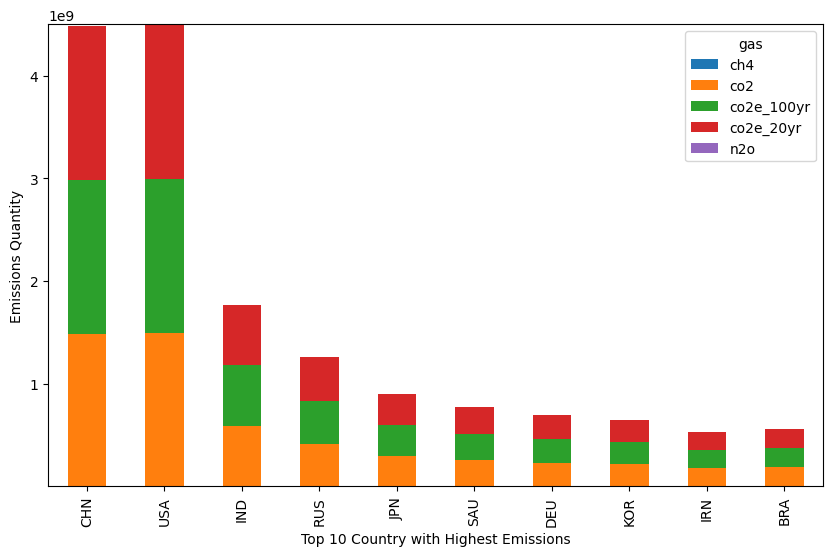

In [8]:
df_countries = df.groupby(['iso3_country', 'gas']).agg('sum').reset_index()
df_countries = df_countries.pivot(index='iso3_country', columns='gas', values='emissions_quantity').fillna(0)
ax = df_countries.nlargest(10, df_countries.columns[-1]).plot(kind='bar', stacked=True, figsize=(10, 6))
ax.set_ylabel('Emissions Quantity')
ax.set_xlabel('Top 10 Country with Highest Emissions')

In [10]:
import matplotlib.pyplot as plt
import numpy as np
import ipywidgets as widgets

df_countries_agg = df.groupby(['iso3_country', 'gas', 'year'])['emissions_quantity'].sum().unstack(level=[1, 2])

top_countries = df.groupby('iso3_country')['emissions_quantity'].sum().nlargest(10).index

color_dict = {'co2': 'blue', 'ch4': 'green', 'n2o': 'red', 'co2e_100yr': 'orange', 'co2e_20yr': 'purple'}

year_dropdown = widgets.Dropdown(options=df['year'].unique(), description='Year')

def update_bar_chart(year):
    plt.figure(figsize=(12, 8))
    index = np.arange(len(top_countries))
    bar_width = 0.2

    for i, gas_type in enumerate(df_countries_agg.columns.levels[0]):
        plt.bar(index + i * bar_width, df_countries_agg[gas_type].loc[:, year].loc[top_countries], bar_width, label=gas_type, color=color_dict[gas_type])

    plt.xlabel('Country')
    plt.ylabel('Emissions Quantity')
    plt.title(f'Emissions by Country and Gas Type in {year}')
    plt.xticks(index + 0.4, top_countries, rotation=45, ha='right')
    plt.legend()
    plt.tight_layout()
    plt.show()

def display_bar_chart(year):
    update_bar_chart(year)

widgets.interact(display_bar_chart, year=year_dropdown)


interactive(children=(Dropdown(description='Year', options=(2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022), v…

<function __main__.display_bar_chart(year)>

In [11]:
import pandas as pd
import plotly.express as px
import ipywidgets as widgets

country_gas_data = df.groupby(['iso3_country', 'gas', 'year'])['emissions_quantity'].sum().reset_index()

def update_plot(gas):
    fig = px.line(title=f'Emissions of {gas.upper()} Over Time for Top 10 Countries')

    for country in top_countries:
        country_data = country_gas_data[(country_gas_data['iso3_country'] == country) & (country_gas_data['gas'] == gas)]
        fig.add_scatter(x=country_data['year'], y=country_data['emissions_quantity'], mode='lines', name=country)

    fig.update_layout(
        xaxis_title='Year',
        yaxis_title=f'Total Emissions Quantity ({gas.upper()})'
    )
    fig.show()

gas_dropdown = widgets.Dropdown(options=df['gas'].unique(), description='Gas Type')

widgets.interactive(update_plot, gas=gas_dropdown)

interactive(children=(Dropdown(description='Gas Type', options=('ch4', 'co2', 'co2e_100yr', 'co2e_20yr', 'n2o'…

## Part 3: Data Visualization

The purpose of this part is to create a 'Viz for Experts' with an interactive dashboard interface for exploring our data.

In [12]:
import altair as alt
import ipywidgets
from vega_datasets import data

In [13]:
# Load world map data for plotting.
countries = alt.topo_feature(data.world_110m.url, 'countries') 

# Create a dropdown widget for selecting years
year_dropdown = ipywidgets.Dropdown(  
    options=df['year'].unique(),  # Set dropdown options to unique years in the DataFrame
    description='Select Year:',  # Set dropdown label
    value=df['year'].min(),  # Set default value to the minimum year in the DataFrame
)

# Create a dropdown widget for selecting gases
gas_dropdown = ipywidgets.Dropdown(  
    options=df['gas'].unique(),  # Set dropdown options to unique gases in the DataFrame
    description='Select Gas:',  # Set dropdown label
    value=df['gas'].min(),  # Set default value to the minimum gas in the DataFrame
)

In [14]:
# Define a color dictionary for each gas
color_dict = {
    'ch4': 'blue',
    'co2': 'red',
    'co2e_100yr': 'green',
    'co2e_20yr': 'orange',
    'n2o': 'purple'
}

def update_chart(gas, year): 
    
    # Filter DataFrame based on selected gas and year
    filtered_df = df[(df['gas'] == gas) & (df['year'] == year)]  
    
    # Create a base world map chart
    chart = alt.Chart(countries).mark_geoshape(  
        fill='lightgray',  # Set fill color for map shapes
        stroke='white'  # Set stroke color for map shapes
    ).project(
        "equirectangular" 
    ).properties(
        width=800,  # Set width of the chart
        height=400  # Set height of the chart
    ) + alt.Chart(filtered_df).mark_circle().encode(  # Overlay filtered data points on the map
        longitude='lon:Q',  # Encode longitude data for positioning circles
        latitude='lat:Q',  # Encode latitude data for positioning circles
        size='emissions_quantity:Q',  # Encode emissions quantity data for circle size
        color=alt.Color('gas:N', scale=alt.Scale(domain=list(color_dict.keys()), range=list(color_dict.values()))),  # Set circle color based on gas
        tooltip=['source_name', 'source_type', 'emissions_quantity']  # Define tooltip content
    )
    
    # chart = chart.interactive()  # Remove this line as it caused Javascript Error: Expression parse error
    
    chart.display()  # Display the chart

# Create an interactive widget to call the update_chart function based on dropdown selections
ipywidgets.interact(update_chart, gas=gas_dropdown, year=year_dropdown) 


interactive(children=(Dropdown(description='Select Gas:', options=('ch4', 'co2', 'co2e_100yr', 'co2e_20yr', 'n…

<function __main__.update_chart(gas, year)>

In [15]:
import plotly.express as px
import pandas as pd

# Convert start_time to string format
df['start_time'] = pd.to_datetime(df['start_time']).dt.strftime('%Y-%m-%d')

fig = px.scatter_geo(df, lat='lat', lon='lon', 
                     hover_name='emissions_quantity',
                     size = 'emissions_quantity',
                     title='Gas Emissions Around the World')

year_dropdown = [{'label': str(year), 'value': year} for year in pd.to_datetime(df['start_time']).dt.year.unique()]
gas_dropdown = [{'label': gas, 'value': gas} for gas in df['gas'].unique()]

fig.update_layout(
    updatemenus=[
        dict(
            buttons=[
                dict(label="All Years",
                     method="update",
                     args=[{"visible": True}, {"title": "Gas Emissions Around the World"}]),
                *[
                    dict(label=f"Select Year {year}",
                         method="update",
                         args=[{"visible": df['start_time'].str[:4] == str(year)}, {"title": f"Gas Emissions in {year}"}])
                    for year in pd.to_datetime(df['start_time']).dt.year.unique()
                ]
            ],
            direction="down",
            showactive=True,
            x=0.1,
            xanchor="left",
            y=1.15,
            yanchor="top"
        ),
        dict(
            buttons=[
                dict(label="All Gases",
                     method="update",
                     args=[{"marker.color": "blue", "title": "Gas Emissions Around the World"}]),
                *[
                    dict(label=f"Select Gas {gas}",
                         method="update",
                         args=[{"marker.color": df['gas'] == gas, "title": f"Emissions of {gas} Around the World"}])
                    for gas in df['gas'].unique()
                ]
            ],
            direction="down",
            showactive=True,
            x=0.1,
            xanchor="left",
            y=1.05,
            yanchor="top"
        )
    ]
)

fig.show()
